In [1]:





# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# <p style="background-color:#9c2162;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">TELCO CUSTOMER CHURN</p>

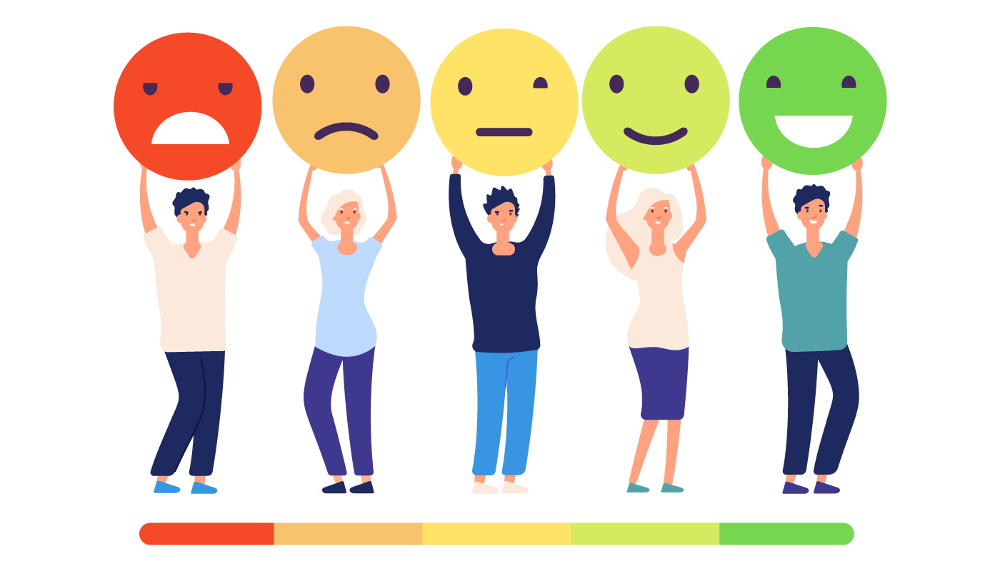

<p style="background-color:#9c2162;font-family:newtimeroman;color:#FFF9ED;font-size:140%;text-align:left;border-radius:10px 10px;">Image credit : https://technologyadvice.com/blog/sales/crm-stop-customer-churn/</p> 

<a id="toc"></a>

## <h3 style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;" class="list-group-item list-group-item-action active" data-toggle="list" role="tablist" aria-controls="home">TABLE OF CONTENTS</h3>

* [   PREFACE](#0)
* [1) LIBRARIES NEEDED IN THE STUDY](#1)
    * [1.1 User Defined Functions](#1.1)
* [2) DATA](#2)
    * [2.1 Context](#2.1)
    * [2.2 About the Features](#2.2) 
    * [2.3 What the Problem is](#2.3) 
* [3) ANALYSIS](#3)
    * [3.1) Reading the Data](#3)
* [4) EXPLORATORY DATA ANALYSIS (EDA) & VISUALIZATION](#4)
    * [4.1 - A General Looking at the Data](#4.1)
    * [4.2 - Convert Multi-Index Columns To One Level](#4.2)
    * [4.3 - Handling with Missing Values](#4.3)
    * [4.4 The Examination of Target Variable](#4.4)
    * [4.5 - The Examination of Skewness, Kurtosis & Multicollinearity](#4.5)
    * [4.6 Numerical vs. Categorical](#4.6) 
        * [4.6.1 Spliting Dataset into Numeric & Categoric Features](#4.6.1)
        * [4.6.2 The Examination of Numerical Features](#4.6.2)
        * [4.6.3 The Examination of Categorical Features](#4.6.3)
    * [4.7 Descriptive Statistics](#4.7) 
* [5) DATA PREPROCESSING](#5)     
    * [5.1 The Implementation of Scaling](#5.1)
* [6) MODELLING WITH K-MEANS](#6)        
    * [6.1 Hopkins Test](#6.1)
    * [6.2 The Implementation of K-Means](#6.2)
        * [6.2.1 Finding The Best K Value With Elbow Method](#6.2.1)
        * [6.2.2 The Implementation of K-Means With Optimal K Value & Visualization](#6.2.2)
        * [6.2.3 The Assesment of Silhouette Scores](#6.2.3)
* [7) MODELLING WITH HIERARCHICAL CLUSTER ANALYSIS (HCA)](#7)  
    * [7.1 The Assesment of Dentrogram](#7.1)
    * [7.2 The Assesment of Silhouette Scores For Hierarchical Cluster Analysis (HCA)](#7.2)   
    * [7.3 The Implementation of Hierarchical Cluster Analysis (HCA)](#7.3)
* [8) THE VISUAL COMPARISON & EVALUATION OF MODELS](#8) 
* [9) CONLUSION](#9)
* [10) REFERENCES](#10)
* [11) FURTHER READINGS](#11)

<a id="0"></a>
## <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">PREFACE</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**In this Exploratory Data Analysis (EDA) and a variety of Unsupervised Clustering algorithms including including K-Means and Hierarchical Cluster Analysis (HCA), this study will examine the dataset named as "Telco Customer Churn" under the 'WA_Fn-UseC_-Telco-Customer-Churn.csv' file at Kaggle website [external link text](https://www.kaggle.com/blastchar/telco-customer-churn).**

**This study, in general, will cover what any beginner in Machine Learning can do as much as possible for a better understanding with the given dataset not only by examining its various aspects but also visualising it. Later S/he will be familiar with Unsupervised Clustering algorithms including including K-Means and Hierarchical Cluster Analysis (HCA) in Machine Learning.**

<a id="1"></a>
## <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">1 - LIBRARIES NEEDED IN THE STUDY</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**First, if you do NOT have the following libraries in your kernel, just install them since you have to need them to import some libraries.**

In [2]:
# !pip install pyforest
# !pip install ipython
# !pip install pyclustertend
# !pip install xlrd
# !pip install Autoviz
# !pip3 install termcolor
# !pip install termcolor
# !pip install pandas-profiling
# !pip install lightgbm
# !pip3 install catboost

**Let's begin importing libraries needed in the given analysis**

In [3]:
# import sys
# print(sys.executable)

In [4]:
#!pip install wordcloud

In [5]:
#from wordcloud import WordCloud

In [6]:
#from autoviz.AutoViz_Class import AutoViz_Class

In [274]:
# 1-Import Libraies
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
%matplotlib inline
import statsmodels.api as sm
import statsmodels.formula.api as smf

from sklearn.compose import make_column_transformer
from sklearn.compose import ColumnTransformer
from sklearn.cluster import KMeans
from pyclustertend import hopkins
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import plot_confusion_matrix, r2_score, mean_absolute_error, mean_squared_error, classification_report, confusion_matrix, accuracy_score, classification_report
from sklearn.metrics import make_scorer, precision_score, precision_recall_curve, plot_precision_recall_curve, plot_roc_curve, roc_auc_score, roc_curve, f1_score, accuracy_score, recall_score

#from autoviz.AutoViz_Class import AutoViz_Class

# 2-Scaling
from sklearn.preprocessing import scale 
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures 
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import PowerTransformer 
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler

# 3-Importing plotly and cufflinks in offline mode
import plotly.express as px
import cufflinks as cf
import plotly.offline
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

# 4-Ignore Warnings
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.warn("this will not show")

# 5-Figure & Display options
plt.rcParams["figure.figsize"] = (10, 6)
pd.set_option('max_colwidth',200)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 200)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

from termcolor import colored
import missingno as msno 

import colorama
from colorama import Fore, Style  # makes strings colored
from termcolor import colored, cprint

# 6-Import Pandas Profiling
import pandas_profiling

<a id="1.1"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">1.1 User Defined Functions</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**We have defined some useful user defined functions**

In [8]:
###############################################################################

def missing(df):
    missing_number = df.isnull().sum().sort_values(ascending=False)
    missing_percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values

def missing_values(df):
    return missing(df)[missing(df)['Missing_Number']>0]

###############################################################################

def first_looking(df):
    print(colored("Shape:", attrs=['bold']), df.shape,'\n',
          f"There is ", df.shape[0], " observation and ", df.shape[1], " columns in the dataset.", '\n',
          colored('-'*79, 'red', attrs=['bold']),
          colored("\nInfo:\n", attrs=['bold']), sep='')
    print(df.info(), '\n', 
          colored('-'*79, 'red', attrs=['bold']), sep='')
    print(colored("Number of Uniques:\n", attrs=['bold']), df.nunique(),'\n',
          colored('-'*79, 'red', attrs=['bold']), sep='')
    print(colored("Missing Values:\n", attrs=['bold']), missing_values(df),'\n', 
          colored('-'*79, 'red', attrs=['bold']), sep='')
    print(colored("All Columns:", attrs=['bold']), list(df.columns),'\n', 
          colored('-'*79, 'red', attrs=['bold']), sep='')

    df.columns= df.columns.str.lower().str.replace('&', '_').str.replace(' ', '_')

    print(colored("Columns after rename:", attrs=['bold']), list(df.columns),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')

def duplicate_values(df):
    duplicate_values = df.duplicated(subset=None, keep='first').sum()
    if duplicate_values > 0:
        df.drop_duplicates(keep='first', inplace=True)
        print(duplicate_values, colored("duplicates were dropped", attrs=['bold']),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')
    else:
        print(colored("No duplicates", attrs=['bold']),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')
        
def drop_columns(df, drop_columns):
    if drop_columns !=[]:
        df.drop(drop_columns, axis=1, inplace=True)
        print(drop_columns, 'were dropped')
    else:
        print(colored('We will now check the missing values and if necessary drop some columns!!!', attrs=['bold']),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')
        
def drop_null(df, limit):
    print('Shape:', df.shape)
    for i in df.isnull().sum().index:
        if (df.isnull().sum()[i]/df.shape[0]*100)>limit:
            print(df.isnull().sum()[i], 'percent of', i ,'null and were dropped')
            df.drop(i, axis=1, inplace=True)
            print('new shape:', df.shape)
        else:
            print(df.isnull().sum()[i], '%, percentage of missing values of', i ,'less than limit', limit, '%, so we will keep it.')
    print('New shape after missing value control:', df.shape)

###############################################################################

In [9]:
# Function for determining the number and percentages of missing values

def missing (df):
    missing_number = df.isnull().sum().sort_values(ascending=False)
    missing_percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values

In [10]:
# To view summary information about the column

def first_look(col):
    print("column name    : ", col)
    print("--------------------------------")
    print("per_of_nulls   : ", "%", round(df[col].isnull().sum()/df.shape[0]*100, 2))
    print("num_of_nulls   : ", df[col].isnull().sum())
    print("num_of_uniques : ", df[col].nunique())
    print(df[col].value_counts(dropna = False))

<a id="2"></a>
## <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">2 - DATA</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**This is a data that allows you to see the world military rankings in 2020 and numerical status such as the army, navy, and air force. In addition, some features such as population and economy related to military power are included as well.**

**For a better understanding and more information, please refer to [external link text](https://www.kaggle.com/blastchar/telco-customer-churn)**

<a id="2.1"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:left; border-radius:10px 10px;">2.1 Context</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**"Predict behavior to retain customers. You can analyze all relevant customer data and develop focused customer retention programs." [IBM Sample Data Sets]**

**Each row represents a customer, each column contains customer’s attributes described on the column Metadata.**

**The data set includes information about:**

- **Customers who left within the last month – the column is called Churn**
- **Services that each customer has signed up for – phone, multiple lines, internet, online security, online backup, device -protection, tech support, and streaming TV and movies**
- **Customer account information – how long they’ve been a customer, contract, payment method, paperless billing, monthly charges, and total charges**
- **Demographic info about customers – gender, age range, and if they have partners and dependents**

**To explore this type of models and learn more about the subject.**

**New version from IBM:**

https://community.ibm.com/community/user/businessanalytics/blogs/steven-macko/2019/07/11/telco-customer-churn-1113

<a id="2.2"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:left; border-radius:10px 10px;">2.2 About The Features</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**The features in the given dataset are:**

- **CustomerID:** A unique ID that identifies each customer.

- **Gender:** The customer’s gender: Male, Female

- **Age:** The customer’s current age, in years, at the time the fiscal quarter ended.

- **Senior Citizen:** Indicates if the customer is 65 or older: Yes, No

- **Married (Partner):** Indicates if the customer is married: Yes, No

- **Dependents:** Indicates if the customer lives with any dependents: Yes, No. Dependents could be children, parents, grandparents, etc.

- **Number of Dependents:** Indicates the number of dependents that live with the customer.

- **Phone Service:** Indicates if the customer subscribes to home phone service with the company: Yes, No

- **Multiple Lines:** Indicates if the customer subscribes to multiple telephone lines with the company: Yes, No

- **Internet Service:** Indicates if the customer subscribes to Internet service with the company: No, DSL, Fiber Optic, Cable.

- **Online Security:** Indicates if the customer subscribes to an additional online security service provided by the company: Yes, No

- **Online Backup:** Indicates if the customer subscribes to an additional online backup service provided by the company: Yes, No

- **Device Protection Plan:** Indicates if the customer subscribes to an additional device protection plan for their Internet equipment provided by the company: Yes, No

- **Premium Tech Support:** Indicates if the customer subscribes to an additional technical support plan from the company with reduced wait times: Yes, No

- **Streaming TV:** Indicates if the customer uses their Internet service to stream television programing from a third party provider: Yes, No. The company does not charge an additional fee for this service.

- **Streaming Movies:** Indicates if the customer uses their Internet service to stream movies from a third party provider: Yes, No. The company does not charge an additional fee for this service.

- **Contract:** Indicates the customer’s current contract type: Month-to-Month, One Year, Two Year.

- **Paperless Billing:** Indicates if the customer has chosen paperless billing: Yes, No

- **Payment Method:** Indicates how the customer pays their bill: Bank Withdrawal, Credit Card, Mailed Check

- **Monthly Charge:** Indicates the customer’s current total monthly charge for all their services from the company.

- **Total Charges:** Indicates the customer’s total charges, calculated to the end of the quarter specified above.

- **Tenure:** Indicates the total amount of months that the customer has been with the company.

- **Churn:** Yes = the customer left the company this quarter. No = the customer remained with the company. Directly related to Churn Value.

<a id="2.3"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:left; border-radius:10px 10px;">2.3 What The Problem Is</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**- In the given study, we have a classification problem.**

- We will try to create classifications on the target variable in the given dataset.
- The Target variable in the given dataset is "Churn"
- Lastly we will build a variety of Unsupervised algorithms including K-Means and Hierarchical Cluster Analysis (HCA).


Based on the data and data dictionary, We have a classification problem.
We wil make classification on the target variable Churn
And we will build a model to get best classification possible on the target variable.
For that we will look at the balance of the target variable.
As we will see later, our target variable has imblanced data
For that reason we are not going to use Accuracy score,
Based on the problem on the hand, we will use Recall score.
For the detailed info about the evaluation metrics

<a id="3"></a>
## <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">3 - ANALYSIS</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

<a id="3.1"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">3.1 Reading The Data</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**How to read and assign the dataset as df. [external link text](https://pandas.pydata.org/docs/reference/api/pandas.read_csv.html) (You can define it as what you want instead of df)**

In [11]:
df0 = pd.read_csv("WA_Fn-UseC_-Telco-Customer-Churn.csv")
df = df0.copy()

In [12]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.850,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.950,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.850,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.300,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.700,151.65,Yes


<a id="4"></a>
## <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">4 - EXPLORATORY DATA ANALYSIS (EDA) & VISUALIZATION</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>


**Before performing Unsupervised Clustering algorithms including including K-Means and Hierarchical Cluster Analysis (HCA), you need to know the data well in order to label the observations correctly. You need to analyze frequency distributions of features, relationships and correlations between the independent variables and the dependent variable. It is recommended to apply data visualization techniques. Observing breakpoints helps you to internalize the data.**

**So, in this Exploratory Data Analysis section the data will be analyzed by summarizing its main characteristics, using statistical graphics and other data visualization methods. As such the reader will be familiar with what the data can tell.**

**You can use first_looking(df) user defined function above for getting a general insight before going further in the analysis**

In [13]:
first_looking(df)

Shape:(7043, 21)
There is 7043 observation and 21 columns in the dataset.
-------------------------------------------------------------------------------
Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043

<a id="4.1"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.1 A General Looking at the Data</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

Pandas profiling is an open source Python module with which we can quickly do an exploratory data analysis with just a few lines of code. Similarly, for EDA, profile_report() is One-Line Magical Code creating reports in the interactive HTML format which is quite easy to understand and analyze the data. In short, at the first hand, what pandas profiling does is to save us all the work of visualizing and understanding the distribution of each variable.

**For a better understanding and more information, please refer to [external link text](https://www.analyticsvidhya.com/blog/2021/06/generate-reports-using-pandas-profiling-deploy-using-streamlit/) & [external link text](https://towardsdatascience.com/exploratory-data-analysis-with-pandas-profiling-de3aae2ddff3)**

In [14]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [15]:
df.head(3)

,customerid,gender,seniorcitizen,partner,dependents,tenure,phoneservice,multiplelines,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,contract,paperlessbilling,paymentmethod,monthlycharges,totalcharges,churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.850,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.950,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.850,108.15,Yes


In [16]:
df.tail(3)

,customerid,gender,seniorcitizen,partner,dependents,tenure,phoneservice,multiplelines,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,contract,paperlessbilling,paymentmethod,monthlycharges,totalcharges,churn
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Electronic check,29.600,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Mailed check,74.400,306.6,Yes
7042,3186-AJIEK,Male,0,No,No,66,Yes,No,Fiber optic,Yes,No,Yes,Yes,Yes,Yes,Two year,Yes,Bank transfer (automatic),105.650,6844.5,No


In [17]:
df.sample(10)

,customerid,gender,seniorcitizen,partner,dependents,tenure,phoneservice,multiplelines,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,contract,paperlessbilling,paymentmethod,monthlycharges,totalcharges,churn
4016,7754-IXRMC,Female,0,No,No,1,Yes,No,DSL,No,No,No,No,No,No,Month-to-month,No,Mailed check,45.350,45.35,No
536,0621-HJWXJ,Female,0,Yes,No,63,Yes,Yes,Fiber optic,No,Yes,No,No,No,No,Month-to-month,Yes,Bank transfer (automatic),81.550,5029.05,No
5835,4641-FROLU,Female,0,Yes,Yes,30,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.300,602.9,No
3398,3096-WPXBT,Female,0,Yes,Yes,61,Yes,Yes,Fiber optic,Yes,Yes,Yes,No,No,Yes,One year,Yes,Credit card (automatic),100.700,6018.65,No
2859,6963-EZQEE,Male,1,Yes,No,70,Yes,Yes,DSL,Yes,Yes,Yes,Yes,Yes,Yes,Two year,Yes,Credit card (automatic),88.550,6306.5,No
4787,5542-DHSXL,Female,0,Yes,No,4,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,No,Mailed check,54.700,235.05,No
5894,7881-INRLC,Male,0,No,No,45,Yes,Yes,Fiber optic,No,Yes,No,No,Yes,Yes,Month-to-month,Yes,Credit card (automatic),100.850,4740,Yes
3561,5998-VVEJY,Male,0,No,No,26,Yes,Yes,Fiber optic,No,No,No,Yes,No,No,Month-to-month,Yes,Electronic check,80.500,2088.8,Yes
6562,3621-CEOVK,Female,1,Yes,No,14,Yes,Yes,Fiber optic,No,Yes,No,No,Yes,Yes,Month-to-month,Yes,Electronic check,100.200,1369.8,Yes
2022,5989-PGKJB,Female,0,No,No,16,Yes,No,Fiber optic,No,Yes,No,No,No,Yes,Month-to-month,Yes,Electronic check,86.250,1340.1,No


In [18]:
df.columns

Index(['customerid', 'gender', 'seniorcitizen', 'partner', 'dependents',
       'tenure', 'phoneservice', 'multiplelines', 'internetservice',
       'onlinesecurity', 'onlinebackup', 'deviceprotection', 'techsupport',
       'streamingtv', 'streamingmovies', 'contract', 'paperlessbilling',
       'paymentmethod', 'monthlycharges', 'totalcharges', 'churn'],
      dtype='object')

In [19]:
print("There is", df.shape[0], "observation and", df.shape[1], "columns in the dataset")

There is 7043 observation and 21 columns in the dataset


In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerid        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   seniorcitizen     7043 non-null   int64  
 3   partner           7043 non-null   object 
 4   dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   phoneservice      7043 non-null   object 
 7   multiplelines     7043 non-null   object 
 8   internetservice   7043 non-null   object 
 9   onlinesecurity    7043 non-null   object 
 10  onlinebackup      7043 non-null   object 
 11  deviceprotection  7043 non-null   object 
 12  techsupport       7043 non-null   object 
 13  streamingtv       7043 non-null   object 
 14  streamingmovies   7043 non-null   object 
 15  contract          7043 non-null   object 
 16  paperlessbilling  7043 non-null   object 


**Even if data type of "totalcharges" column is object type, it has numerical values. So we need to change its data type to float type.**

**However, when we try to change its data type to float type, we have grasped that "totalcharges" feature has some missing values of " ". So we will take care of both issues in the "Handling with Missing Values" section.**

In [21]:
df.describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='RdPu')

,count,mean,std,min,25%,50%,75%,max
seniorcitizen,7043.000000,0.162147,0.368612,0.000000,0.000000,0.000000,0.000000,1.000000
tenure,7043.000000,32.371149,24.559481,0.000000,9.000000,29.000000,55.000000,72.000000
monthlycharges,7043.000000,64.761692,30.090047,18.250000,35.500000,70.350000,89.850000,118.750000


In [22]:
df.describe(include=object).T

,count,unique,top,freq
customerid,7043,7043,7590-VHVEG,1
gender,7043,2,Male,3555
partner,7043,2,No,3641
dependents,7043,2,No,4933
phoneservice,7043,2,Yes,6361
multiplelines,7043,3,No,3390
internetservice,7043,3,Fiber optic,3096
onlinesecurity,7043,3,No,3498
onlinebackup,7043,3,No,3088
deviceprotection,7043,3,No,3095


In [23]:
df.nunique()

customerid          7043
gender                 2
seniorcitizen          2
partner                2
dependents             2
tenure                73
phoneservice           2
multiplelines          3
internetservice        3
onlinesecurity         3
onlinebackup           3
deviceprotection       3
techsupport            3
streamingtv            3
streamingmovies        3
contract               3
paperlessbilling       2
paymentmethod          4
monthlycharges      1585
totalcharges        6531
churn                  2
dtype: int64

In [24]:
# to find how many unique values numerical features have

for col in df.select_dtypes(include=[np.number]).columns:
  print(colored(f"{col}", 'green', attrs=['bold']), f"feature has", colored(f"{df[col].nunique()}", 'green', attrs=['bold']), f"unique values.")

seniorcitizen feature has 2 unique values.
tenure feature has 73 unique values.
monthlycharges feature has 1585 unique values.


In [25]:
# to find how many unique values object features have

for col in df.select_dtypes(include="object").columns:
  print(colored(f"{col}", 'green', attrs=['bold']), f"feature has", colored(f"{df[col].nunique()}", 'green', attrs=['bold']), f"unique values.")

customerid feature has 7043 unique values.
gender feature has 2 unique values.
partner feature has 2 unique values.
dependents feature has 2 unique values.
phoneservice feature has 2 unique values.
multiplelines feature has 3 unique values.
internetservice feature has 3 unique values.
onlinesecurity feature has 3 unique values.
onlinebackup feature has 3 unique values.
deviceprotection feature has 3 unique values.
techsupport feature has 3 unique values.
streamingtv feature has 3 unique values.
streamingmovies feature has 3 unique values.
contract feature has 3 unique values.
paperlessbilling feature has 2 unique values.
paymentmethod feature has 4 unique values.
totalcharges feature has 6531 unique values.
churn feature has 2 unique values.


**When we compare the number of unique values with the description of each feature in "2.2 About The Features" section, it can be easily captured that some features should be fixed.**

- multiplelines          3
- internetservice        3
- onlinesecurity         3
- onlinebackup           3
- deviceprotection       3
- techsupport            3
- streamingtv            3
- streamingmovies        3
- contract               3

**This issue will be solved in the section of "The Examination of Categorical Variables".**

In [26]:
df.duplicated().value_counts()

False    7043
dtype: int64

In [27]:
duplicate = df[df.duplicated()]

In [28]:
duplicate

,customerid,gender,seniorcitizen,partner,dependents,tenure,phoneservice,multiplelines,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,contract,paperlessbilling,paymentmethod,monthlycharges,totalcharges,churn


**Let's remove "customerID" column from the given dataset since it is NOT useful for any classification in our analysis.**

In [29]:
df.shape

(7043, 21)

In [30]:
df.drop("customerid", axis=1, inplace=True)

In [31]:
df.drop_duplicates(keep=False, inplace=True)

In [32]:
df.shape

(7001, 20)

<a id="4.3"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.3 Handling With Missing Values</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**Missing data (or missing values) is defined as the data value that is not stored for a variable in the observation of interest. The problem of missing data is relatively common in almost all research and can have a significant effect on the conclusions that can be drawn from the data. Accordingly, all studies need to focus on handling the missing data, problems caused by missing data, and the methods to avoid or minimize their effects on the analysis. Otherwise, missing data can reduce the statistical power of a study and can produce biased estimates, leading to invalid conclusions.**

**For a better understanding and more information how to handle with missing values in Machine Learning, please refer to [external link text](https://machinelearningmastery.com/handle-missing-data-python/) & [external link text](https://www.kaggle.com/kaanboke/the-most-used-methods-to-deal-with-missing-values)**

**A General Look At The Missing Values**

In [33]:
missing(df)

,Missing_Number,Missing_Percent
gender,0,0.000
seniorcitizen,0,0.000
totalcharges,0,0.000
monthlycharges,0,0.000
paymentmethod,0,0.000
paperlessbilling,0,0.000
contract,0,0.000
streamingmovies,0,0.000
streamingtv,0,0.000
techsupport,0,0.000


In [34]:
df.isnull().melt(value_name="missing")

,variable,missing
0,gender,False
1,gender,False
2,gender,False
3,gender,False
4,gender,False
...,...,...
140015,churn,False
140016,churn,False
140017,churn,False
140018,churn,False


In [35]:
plt.figure(figsize=(4, 6))

sns.displot(
    data=df.isnull().melt(value_name="missing"),
    y="variable",
    hue="missing",
    multiple="fill",
    height=9.25
)

plt.axvline(0.3, color="r");

**We don't see any missing values as we examine the dataset in general; however, when we look over each feature one by one in detail, we have grasped that "totalcharges" feature has some missing values since while converting its data type.**

**Additionally, as you remember from the previous session, even if data type of "totalcharges" column is object type, it has numerical values. So we also need to change its data type to float type.**

In [36]:
first_look('totalcharges')

column name    :  totalcharges
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  6529
          11
19.75      9
19.9       6
20.2       6
19.65      6
          ..
203.95     1
6849.4     1
692.35     1
130.15     1
6844.5     1
Name: totalcharges, Length: 6529, dtype: int64


**In the 'totalcharges' feature there have been 11 missing values coded as " ".**

In [37]:
print("Before dealing with blank values")
print(df[df['totalcharges'] == ' '].index) 

Before dealing with blank values
Int64Index([488, 753, 936, 1082, 1340, 3331, 3826, 4380, 5218, 6670, 6754], dtype='int64')


In [38]:
df['totalcharges'][488]

' '

In [39]:
df['totalcharges']= df['totalcharges'].apply(lambda x: x if x!= ' ' else np.nan).astype(float)

In [40]:
df['totalcharges'][488]

nan

In [41]:
first_look('totalcharges')

column name    :  totalcharges
--------------------------------
per_of_nulls   :  % 0.16
num_of_nulls   :  11
num_of_uniques :  6528
NaN         11
19.750       9
19.900       6
20.200       6
19.650       6
            ..
203.950      1
6849.400     1
692.350      1
130.150      1
6844.500     1
Name: totalcharges, Length: 6529, dtype: int64


**SPECIAL NOTE: In the given dataset, there have been 11 missing values in the column of "totalcharges". These missing values will be handled with after Train & Split process for preventing data leakage.**

<a id="4.4"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.4 The Examination of Target Variable</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**We will encode the target variable of "churn" to binary variable here. However, some of you, as a second option, prefer to perform label encoding using the following code. It's up to you**

In [42]:
# LE = LabelEncoder()
# df['churn'] = LE.fit_transform(df['churn'])

In [43]:
df['churn']= df['churn'].apply(lambda x: 0 if x=="No" else 1).astype(float)

In [44]:
# Let's take a quick look at Target variable

first_look('churn')

column name    :  churn
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  2
0.000    5156
1.000    1845
Name: churn, dtype: int64


In [45]:
y = df['churn']

print(f'Percentage of \033[1m"being churn"\033[0m: % {round(y.value_counts(normalize=True)[1]*100,2)} --> \
({y.value_counts()[1]} churn cases out of {len(df)})\nPercentage of \033[1m"Not being churn"\033[0m: % {round(y.value_counts(normalize=True)[0]*100,2)} --> ({y.value_counts()[0]} NOT churn cases out of {len(df)})')

df["churn"].value_counts().plot(kind="pie", autopct='%1.1f%%', figsize=(8, 8));

Percentage of "being churn": % 26.35 --> (1845 churn cases out of 7001)
Percentage of "Not being churn": % 73.65 --> (5156 NOT churn cases out of 7001)


In [46]:
df['churn'].iplot(kind='hist')

**As easily understood from the plots, we have an imbalanced data.**

**% 26.35 of customers, who represent 1845 people out of 7001, didn't show loyalty to the company and got churned while % 73.65 of which representing 5156 people out of 7001 showed loyalty to the company.**


In [47]:
df[df['churn']==0].describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='RdPu')

,count,mean,std,min,25%,50%,75%,max
seniorcitizen,5156.000000,0.129170,0.335420,0.000000,0.000000,0.000000,0.000000,1.000000
tenure,5156.000000,37.697634,24.058648,0.000000,15.000000,38.000000,61.000000,72.000000
monthlycharges,5156.000000,61.408922,31.051300,18.250000,25.150000,64.550000,88.550000,118.750000
totalcharges,5145.000000,2564.213887,2328.687970,18.800000,587.700000,1697.700000,4267.150000,8672.450000
churn,5156.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [48]:
df[df['churn']==1].describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='RdPu')

,count,mean,std,min,25%,50%,75%,max
seniorcitizen,1845.000000,0.256911,0.437048,0.000000,0.000000,0.000000,1.000000,1.000000
tenure,1845.000000,18.200000,19.560896,1.000000,2.000000,10.000000,29.000000,72.000000
monthlycharges,1845.000000,74.769404,24.526762,18.850000,57.150000,79.800000,94.300000,118.350000
totalcharges,1845.000000,1551.081626,1895.457032,18.850000,145.000000,732.500000,2354.800000,8684.800000
churn,1845.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [49]:
print( f"Skewness: {df['churn'].skew()}")

Skewness: 1.0737362279365827


In [50]:
print( f"Kurtosis: {df['churn'].kurtosis()}")

Kurtosis: -0.8473326549115874


<a id="4.5"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.5 - The Examination of Skewness, Kurtosis & Multicollinearity</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**Skewness**

In [51]:
df_skew_temp = df.skew()
df_skew_temp = pd.DataFrame(df_skew_temp, columns=["skewness_value"])
df_skew_temp

,skewness_value
seniorcitizen,1.827
tenure,0.232
monthlycharges,-0.227
totalcharges,0.955
churn,1.074


**Interpreting Skewness**

0.5 is our threshold-limit to evaluate skewness. Overall below abs(1) seems acceptable for the linear models.

In [52]:
symetric_features = []
moderate_skewed_features = []
highly_skewed_features = []

for col, skew in df_skew_temp.iterrows():
        if -0.5 < skew[0] < 0.5:
            symetric_features.append(col)
            print(f"The skewness value of", colored(f"{skew[0]}", 'green', attrs=['bold']), "for", colored(f"{col}", 'green', attrs=['bold']), "feature means that the distribution is approx.", colored(f"symmetric", 'green', attrs=['bold']))
        elif (-0.5 < skew[0] < -1.0) or (0.5 < skew[0] < 1.0):  
            moderate_skewed_features.append(col)
            print(f"The skewness value of", colored(f"{skew[0]}", 'yellow', attrs=['bold']), "for", colored(f"{col}", 'yellow', attrs=['bold']), "feature means that the distribution is approx.", colored(f"moderately symmetric", 'yellow', attrs=['bold']))
        else:
            highly_skewed_features.append(col)
            print(f"The skewness value of", colored(f"{skew[0]}", 'red', attrs=['bold']), "for", colored(f"{col}", 'red', attrs=['bold']), "feature means that the distribution is approx.", colored(f"highly symmetric", 'red', attrs=['bold']))

print(colored('*'*120, 'cyan', attrs=['bold']))
print("\033[1mThe number of symetric features:\033[0m", len(symetric_features))
print("\033[1mThe number of moderately skewed features:\033[0m", len(moderate_skewed_features)) 
print("\033[1mThe number of highly skewed features:\033[0m", len(highly_skewed_features)) 

The skewness value of 1.826790646995883 for seniorcitizen feature means that the distribution is approx. highly symmetric
The skewness value of 0.23191591595504282 for tenure feature means that the distribution is approx. symmetric
The skewness value of -0.22717300705554097 for monthlycharges feature means that the distribution is approx. symmetric
The skewness value of 0.9553038126623016 for totalcharges feature means that the distribution is approx. moderately symmetric
The skewness value of 1.0737362279365827 for churn feature means that the distribution is approx. highly symmetric
************************************************************************************************************************
The number of symetric features: 2
The number of moderately skewed features: 1
The number of highly skewed features: 2


**Kurtosis**

Kurtosis are of three types:

Mesokurtic: When the tails of the distibution is similar to the normal distribution then it is mesokurtic. The kutosis for normal distibution is 3.

Leptokurtic: If the kurtosis is greater than 3 then it is leptokurtic. In this case, the tails will be heaviour than the normal distribution which means lots of outliers are present in the data. It can be recognized as thin bell shaped distribution with peak higher than normal distribution.

Platykurtic: Kurtosis will be less than 3 which implies thinner tail or lack of outliers than normal distribution.In case of platykurtic, bell shaped distribution will be broader and peak will be lower than the mesokurtic. Hair et al. (2010) and Bryne (2010) argued that data is considered to be normal if Skewness is between ‐2 to +2 and Kurtosis is between ‐7 to +7.

Multi-normality data tests are performed using leveling asymmetry tests (skewness < 3), (Kurtosis between -2 and 2) and Mardia criterion (< 3). Source Chemingui, H., & Ben lallouna, H. (2013).

Skewness and kurtosis index were used to identify the normality of the data. The result suggested the deviation of data from normality was not severe as the value of skewness and kurtosis index were below 3 and 10 respectively (Kline, 2011). Source Yadav, R., & Pathak, G. S. (2016).

**Interpreting Kurtosis**

1.0 is our threshold-limit to evaluate kurtosis.

In [53]:
#Calculating Kurtosis 

kurtosis_limit = 1 
kurtosis_vals = df.kurtosis()
kurtosis_cols = kurtosis_vals[abs(kurtosis_vals) > kurtosis_limit].sort_values(ascending=False)
kurtosis_cols

seniorcitizen     1.338
monthlycharges   -1.251
tenure           -1.389
dtype: float64

**Multicollinearity**

Let's first plot the heatmap and examine the correlations among the features visually. 

In [54]:
plt.figure(figsize=(14, 10))

# Getting the Upper Triangle of the co-relation matrix
matrix = np.triu(df.corr())

# using the upper triangle matrix as mask 
sns.heatmap(df.corr(), annot=True, cmap = sns.cubehelix_palette(8), mask=matrix)

plt.xticks(rotation=45);

In [55]:
sns.scatterplot(data=df, x="tenure", y="totalcharges", hue="churn");

**It can be concluded that there has been weak correlations between the numerical features and the target variable while a strong correlation between "tenure" and "totalcharges". Nevertheless, if we accept the level of 0.85 as criteria for multicollinearity, it can be concluded that there is no multi-colliniearity problem between "tenure" and "totalcharges".** 

Based on the matrix, we can observe weak level correlation between the numerical features and the target variable
There is strong correlation between tenure and total charges.
Being senior citizen and increasing monthly charges have a positive correlation with the churn.
Senior citizen more likely churn than younger customers.
Customer with higher monthly charges also more likely churn than lesser monthly charges customers.
Being long term with the company, customer less likely churn than customer with lesser time with the company.
Total charges has negative correlation with the churn.

Let's check if there is a multicollinearity problem among the features.

In [56]:
df_temp = df.corr()

feature =[]
collinear=[]

for col in df_temp.columns:
    for i in df_temp.index:
        if (df_temp[col][i]> .85 and df_temp[col][i] < 1) or (df_temp[col][i]< -.85 and df_temp[col][i] > -1) :
                feature.append(col)
                collinear.append(i)
                print(Fore.RED + f"\033[1mmulticolinearity alert\033[0m between {col} - {i}")
        else:
            print(f"For {col} and {i}, there is \033[1mNO multicollinearity problem\033[0m") 

unique_list = list(set(feature+collinear))

print(colored('*'*80, 'cyan', attrs=['bold']))
print("\033[1mThe total number of strong corelated features:\033[0m", len(unique_list)) 

For seniorcitizen and seniorcitizen, there is NO multicollinearity problem
For seniorcitizen and tenure, there is NO multicollinearity problem
For seniorcitizen and monthlycharges, there is NO multicollinearity problem
For seniorcitizen and totalcharges, there is NO multicollinearity problem
For seniorcitizen and churn, there is NO multicollinearity problem
For tenure and seniorcitizen, there is NO multicollinearity problem
For tenure and tenure, there is NO multicollinearity problem
For tenure and monthlycharges, there is NO multicollinearity problem
For tenure and totalcharges, there is NO multicollinearity problem
For tenure and churn, there is NO multicollinearity problem
For monthlycharges and seniorcitizen, there is NO multicollinearity problem
For monthlycharges and tenure, there is NO multicollinearity problem
For monthlycharges and monthlycharges, there is NO multicollinearity problem
For monthlycharges and totalcharges, there is NO multicollinearity problem
For monthlycharges

<a id="4.6"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.6 Numerical vs. Categorical</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

<a id="4.6.1"></a>
#### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.6.1 Spliting Dataset into Numeric & Categoric Features</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [57]:
df.dtypes

gender               object
seniorcitizen         int64
partner              object
dependents           object
tenure                int64
phoneservice         object
multiplelines        object
internetservice      object
onlinesecurity       object
onlinebackup         object
deviceprotection     object
techsupport          object
streamingtv          object
streamingmovies      object
contract             object
paperlessbilling     object
paymentmethod        object
monthlycharges      float64
totalcharges        float64
churn               float64
dtype: object

In [58]:
df['seniorcitizen']= df['seniorcitizen'].astype(float)
df['tenure']= df['tenure'].astype(float)

In [59]:
numerical= df.drop(['churn'], axis=1).select_dtypes('number').columns

categorical = df.select_dtypes('object').columns

print(colored("Numerical Columns:", attrs=['bold']), list(df[numerical].columns),'\n',
              colored('-'*124, 'red', attrs=['bold']), sep='')
print(colored("Categorical Columns:", attrs=['bold']), list(df[categorical].columns),'\n',
              colored('-'*124, 'red', attrs=['bold']), sep='')

Numerical Columns:['seniorcitizen', 'tenure', 'monthlycharges', 'totalcharges']
----------------------------------------------------------------------------------------------------------------------------
Categorical Columns:['gender', 'partner', 'dependents', 'phoneservice', 'multiplelines', 'internetservice', 'onlinesecurity', 'onlinebackup', 'deviceprotection', 'techsupport', 'streamingtv', 'streamingmovies', 'contract', 'paperlessbilling', 'paymentmethod']
----------------------------------------------------------------------------------------------------------------------------


<a id="4.6.2"></a>
#### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.6.2 The Examination of Numerical Features</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [60]:
df[numerical].head().T

,0,1,2,3,4
seniorcitizen,0.000,0.000,0.000,0.000,0.000
tenure,1.000,34.000,2.000,45.000,2.000
monthlycharges,29.850,56.950,53.850,42.300,70.700
totalcharges,29.850,1889.500,108.150,1840.750,151.650


In [61]:
df[numerical].describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='RdPu').format('{:.2f}')

,count,mean,std,min,25%,50%,75%,max
seniorcitizen,7001.000000,0.162834,0.369240,0.000000,0.000000,0.000000,0.000000,1.000000
tenure,7001.000000,32.559349,24.512177,0.000000,9.000000,29.000000,56.000000,72.000000
monthlycharges,7001.000000,64.929860,30.052788,18.250000,35.800000,70.450000,89.900000,118.750000
totalcharges,6990.000000,2296.799149,2266.851369,18.800000,414.312500,1411.775000,3820.687500,8684.800000


In [62]:
df[numerical].drop("seniorcitizen", axis=1).iplot(kind='hist');

In [63]:
df[numerical].drop("seniorcitizen", axis=1).iplot(kind='histogram', subplots=True, bins=50)

In [64]:
for i in df[numerical].drop("seniorcitizen", axis=1):
    df[i].iplot(kind="box", title=i, boxpoints="all", color='lightseagreen')

In [65]:
index = 0
plt.figure(figsize=(20,20))
for feature in numerical:
    if feature != "churn":
        index += 1
        plt.subplot(4, 3, index)
        sns.boxplot(x='churn', y=feature, data=df)

**Plotly library is very useful for data visualization and understanding the data simply and easily. One of the visualization functions is scatter_3d() which is used to create a 3D scatter plot and can be used with pandas dataframes.** 

**3D scatter plots are used to plot data points on three axes in an attempt to show the relationship between three variables. Each row in the data table is represented by a marker whose position depends on its values in the columns set on the X, Y, and Z axes. A fourth variable can be set to correspond to the color or size of the markers; thus, adding yet another dimension to the plot.**

In [66]:
fig = px.scatter_3d(df, 
                    x='monthlycharges',
                    y='seniorcitizen',
                    z='tenure',
                    color='churn')
fig.show();

In [67]:
sns.pairplot(df, hue="churn", palette="inferno", corner=True);

<a id="4.6.3"></a>
#### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.6.3 The Examination of Categorical Features</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [68]:
df[categorical].head().T

,0,1,2,3,4
gender,Female,Male,Male,Male,Female
partner,Yes,No,No,No,No
dependents,No,No,No,No,No
phoneservice,No,Yes,Yes,No,Yes
multiplelines,No phone service,No,No,No phone service,No
internetservice,DSL,DSL,DSL,DSL,Fiber optic
onlinesecurity,No,Yes,Yes,Yes,No
onlinebackup,Yes,No,Yes,No,No
deviceprotection,No,Yes,No,Yes,No
techsupport,No,No,No,Yes,No


In [69]:
df[categorical].describe().T.style.background_gradient(subset=['unique','freq','count'], cmap='RdPu')

,count,unique,top,freq
gender,7001,2,Male,3529
partner,7001,2,No,3599
dependents,7001,2,No,4891
phoneservice,7001,2,Yes,6319
multiplelines,7001,3,No,3348
internetservice,7001,3,Fiber optic,3084
onlinesecurity,7001,3,No,3482
onlinebackup,7001,3,No,3072
deviceprotection,7001,3,No,3079
techsupport,7001,3,No,3457


In [70]:
df[categorical].nunique()

gender              2
partner             2
dependents          2
phoneservice        2
multiplelines       3
internetservice     3
onlinesecurity      3
onlinebackup        3
deviceprotection    3
techsupport         3
streamingtv         3
streamingmovies     3
contract            3
paperlessbilling    2
paymentmethod       4
dtype: int64

**It looks like there has NOT been a high cardinality issue.**

**On the other hand, when we consider the descriptions about features in the "2.2 About The Features" of this study, some features such as "multiplelines", "onlinesecurity", "onlinebackup", "deviceprotection", "techsupport", "streamingtv" and "streamingmovies" have more categories than expected. Therefore, we have to catagorize them to "No" and "Yes" in consistent with their orginal form.**

In [71]:
df["onlinesecurity"].value_counts()

No                     3482
Yes                    2019
No internet service    1500
Name: onlinesecurity, dtype: int64

In [72]:
df["multiplelines"]= df["multiplelines"].replace("No phone service", "No")

In [73]:
df[["onlinesecurity", "onlinebackup", "deviceprotection", "techsupport", "streamingtv", "streamingmovies"]] = df[["onlinesecurity", "onlinebackup", "deviceprotection", "techsupport", "streamingtv", "streamingmovies"]].replace("No internet service", "No")

In [74]:
df[categorical].nunique()

gender              2
partner             2
dependents          2
phoneservice        2
multiplelines       2
internetservice     3
onlinesecurity      2
onlinebackup        2
deviceprotection    2
techsupport         2
streamingtv         2
streamingmovies     2
contract            3
paperlessbilling    2
paymentmethod       4
dtype: int64

**Now we can compare each categorical variable with target variable for the bivariate analysis.**

In [75]:
for i, col in enumerate(df[categorical].columns):
    fig = px.histogram(df[col], color=df["churn"], width=800, height=800, title=col, pattern_shape=df["contract"], pattern_shape_sequence=["x", ".", "+"])
    fig.show()

**When we focus on "churn" part (1) in each category, it's easy captured that "Month-to-month" contract type comprises most of being churn.**

**Now, let's examine crosstab outputs for each variable.**

In [76]:
for i, col in enumerate(df[categorical].columns):
    xtab = pd.crosstab(df[col], df["churn"], normalize=True)
    print(colored('-'*40, 'red', attrs=['bold']), sep='')
    print(xtab*100)

----------------------------------------
churn   0.000  1.000
gender              
Female 36.323 13.270
Male   37.323 13.084
----------------------------------------
churn    0.000  1.000
partner              
No      34.609 16.798
Yes     39.037  9.556
----------------------------------------
churn       0.000  1.000
dependents              
No         48.165 21.697
Yes        25.482  4.656
----------------------------------------
churn         0.000  1.000
phoneservice              
No            7.313  2.428
Yes          66.333 23.925
----------------------------------------
churn          0.000  1.000
multiplelines              
No            43.351 14.212
Yes           30.296 12.141
----------------------------------------
churn            0.000  1.000
internetservice              
DSL             28.025  6.499
Fiber optic     25.696 18.355
No              19.926  1.500
----------------------------------------
churn           0.000  1.000
onlinesecurity              
No           

In [77]:
fig = px.histogram(df, x=df.contract, animation_frame="tenure", facet_col="churn")
fig.show()

In [78]:
fig = px.histogram(df, x=df.tenure, animation_frame=df.contract, facet_col="churn")
fig.show()

**Overall Distribution of Target ("Churn") Variable.**

In [79]:
plt.figure(figsize=(8, 8))

explode = [0, 0.1]
plt.pie(df['churn'].value_counts(), explode=explode, autopct='%1.1f%%', shadow=True, startangle=140)
plt.legend(labels=['1', '0'])
plt.title('Churn Distribution')
plt.axis('off');

<a id="4.7"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.7 Descriptive Statistics</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [80]:
df.describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='RdPu')

,count,mean,std,min,25%,50%,75%,max
seniorcitizen,7001.000000,0.162834,0.369240,0.000000,0.000000,0.000000,0.000000,1.000000
tenure,7001.000000,32.559349,24.512177,0.000000,9.000000,29.000000,56.000000,72.000000
monthlycharges,7001.000000,64.929860,30.052788,18.250000,35.800000,70.450000,89.900000,118.750000
totalcharges,6990.000000,2296.799149,2266.851369,18.800000,414.312500,1411.775000,3820.687500,8684.800000
churn,7001.000000,0.263534,0.440581,0.000000,0.000000,0.000000,1.000000,1.000000


<a id="5"></a>
## <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">5 - DATA PREPROCESSING</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [81]:
df.head()

,gender,seniorcitizen,partner,dependents,tenure,phoneservice,multiplelines,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,contract,paperlessbilling,paymentmethod,monthlycharges,totalcharges,churn
0,Female,0.000,Yes,No,1.000,No,No,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.850,29.850,0.000
1,Male,0.000,No,No,34.000,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.950,1889.500,0.000
2,Male,0.000,No,No,2.000,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.850,108.150,1.000
3,Male,0.000,No,No,45.000,No,No,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.300,1840.750,0.000
4,Female,0.000,No,No,2.000,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.700,151.650,1.000


In [82]:
X = df.drop("churn", axis=1)
y = df["churn"]

In [83]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

<IPython.core.display.Javascript object>

In [84]:
y_train.value_counts(normalize=True)*100

0.000   73.429
1.000   26.571
Name: churn, dtype: float64

In [85]:
y_test.value_counts(normalize=True)*100

0.000   74.518
1.000   25.482
Name: churn, dtype: float64

In [86]:
X_train

,gender,seniorcitizen,partner,dependents,tenure,phoneservice,multiplelines,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,contract,paperlessbilling,paymentmethod,monthlycharges,totalcharges
6679,Female,0.000,Yes,No,60.000,No,No,DSL,Yes,Yes,No,Yes,No,No,Two year,No,Bank transfer (automatic),37.700,2288.700
3910,Female,0.000,No,No,47.000,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,106.400,5127.950
2669,Female,0.000,No,No,19.000,Yes,Yes,Fiber optic,Yes,Yes,No,No,No,Yes,Month-to-month,Yes,Electronic check,95.150,1789.250
7017,Female,0.000,No,No,51.000,Yes,No,No,No,No,No,No,No,No,Two year,No,Bank transfer (automatic),20.650,1020.750
6622,Male,0.000,No,No,2.000,Yes,Yes,DSL,No,No,No,No,No,Yes,Month-to-month,No,Bank transfer (automatic),62.050,118.300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3795,Male,0.000,No,No,12.000,Yes,No,Fiber optic,No,No,No,No,Yes,No,Month-to-month,Yes,Electronic check,81.450,912.000
5220,Female,0.000,No,No,29.000,Yes,No,DSL,Yes,No,Yes,Yes,No,No,One year,No,Credit card (automatic),58.000,1734.500
5255,Female,0.000,No,No,31.000,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,76.050,2227.800
5419,Female,1.000,Yes,No,72.000,Yes,Yes,Fiber optic,Yes,No,No,No,No,No,Two year,No,Bank transfer (automatic),78.500,5602.250


**Let's handle with missing values using SimpleImputer.**

In [87]:
X_train.isnull().sum()

gender              0
seniorcitizen       0
partner             0
dependents          0
tenure              0
phoneservice        0
multiplelines       0
internetservice     0
onlinesecurity      0
onlinebackup        0
deviceprotection    0
techsupport         0
streamingtv         0
streamingmovies     0
contract            0
paperlessbilling    0
paymentmethod       0
monthlycharges      0
totalcharges        6
dtype: int64

In [88]:
X_test.isnull().sum()

gender              0
seniorcitizen       0
partner             0
dependents          0
tenure              0
phoneservice        0
multiplelines       0
internetservice     0
onlinesecurity      0
onlinebackup        0
deviceprotection    0
techsupport         0
streamingtv         0
streamingmovies     0
contract            0
paperlessbilling    0
paymentmethod       0
monthlycharges      0
totalcharges        5
dtype: int64

In [89]:
from sklearn.impute import SimpleImputer

# Imputation
imputer = SimpleImputer(missing_values=np.nan, strategy="mean")
X_train.totalcharges = imputer.fit_transform(X_train["totalcharges"].values.reshape(-1,1))
X_test.totalcharges = imputer.transform(X_test["totalcharges"].values.reshape(-1,1))

In [90]:
X_train.isnull().sum()

gender              0
seniorcitizen       0
partner             0
dependents          0
tenure              0
phoneservice        0
multiplelines       0
internetservice     0
onlinesecurity      0
onlinebackup        0
deviceprotection    0
techsupport         0
streamingtv         0
streamingmovies     0
contract            0
paperlessbilling    0
paymentmethod       0
monthlycharges      0
totalcharges        0
dtype: int64

In [91]:
X_test.isnull().sum()

gender              0
seniorcitizen       0
partner             0
dependents          0
tenure              0
phoneservice        0
multiplelines       0
internetservice     0
onlinesecurity      0
onlinebackup        0
deviceprotection    0
techsupport         0
streamingtv         0
streamingmovies     0
contract            0
paperlessbilling    0
paymentmethod       0
monthlycharges      0
totalcharges        0
dtype: int64

**Let's convert categorical variables using OneHotEncoder.**

In [92]:
df[categorical].head()

,gender,partner,dependents,phoneservice,multiplelines,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,contract,paperlessbilling,paymentmethod
0,Female,Yes,No,No,No,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check
1,Male,No,No,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check
2,Male,No,No,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check
3,Male,No,No,No,No,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic)
4,Female,No,No,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check


In [93]:
OHE = OneHotEncoder(sparse=False, drop="if_binary")
OHE_df = OHE.fit_transform(df[categorical])
OHE_df = pd.DataFrame(OHE_df, columns=OHE.get_feature_names(df[categorical].columns))
OHE_df.head()

,gender_Male,partner_Yes,dependents_Yes,phoneservice_Yes,multiplelines_Yes,internetservice_DSL,internetservice_Fiber optic,internetservice_No,onlinesecurity_Yes,onlinebackup_Yes,deviceprotection_Yes,techsupport_Yes,streamingtv_Yes,streamingmovies_Yes,contract_Month-to-month,contract_One year,contract_Two year,paperlessbilling_Yes,paymentmethod_Bank transfer (automatic),paymentmethod_Credit card (automatic),paymentmethod_Electronic check,paymentmethod_Mailed check
0,0.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000
1,1.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,1.000
2,1.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,1.000,1.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,1.000
3,1.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,1.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000
4,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000


In [94]:
categorical

Index(['gender', 'partner', 'dependents', 'phoneservice', 'multiplelines',
       'internetservice', 'onlinesecurity', 'onlinebackup', 'deviceprotection',
       'techsupport', 'streamingtv', 'streamingmovies', 'contract',
       'paperlessbilling', 'paymentmethod'],
      dtype='object')

<a id="6"></a>
## <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">6 - MODELLING WITH MULTIPLE ALGORITHMS</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [97]:
# Libraries Needed in This Section

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier

from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBRegressor, XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import confusion_matrix, recall_score, classification_report, roc_auc_score, f1_score, accuracy_score

**Modelling with Default Parameters Without Scalling & class_weight**

In [95]:
transformer = ColumnTransformer([("OHE", OneHotEncoder(drop="if_binary"), categorical)], 
                                remainder="passthrough")

In [257]:
models = []

models.append(("LR", LogisticRegression()))
models.append(("SVC", SVC()))
models.append(("KNN", KNeighborsClassifier()))
models.append(("DT", DecisionTreeClassifier()))
models.append(("RF", RandomForestClassifier()))
models.append(("ADA", AdaBoostClassifier()))
models.append(("GB", GradientBoostingClassifier()))
models.append(("XGB", XGBClassifier(eval_metric='mlogloss')))

# evaluate each model in turn

results = []
names = []
f1_scores = []
recall_scores = []
roc_auc_scores = []
acc_scores = []

for name, model in models:
    pipe = Pipeline([("transformer", transformer),
                     ("model", model)])
    kfold = StratifiedKFold(n_splits=10, random_state=42, shuffle=True)
    cv_results = cross_val_score(pipe, X_train, y_train, cv=kfold, scoring="recall")
    
    results.append(cv_results)
    names.append(name)

    y_pred = pipe.fit(X_train, y_train).predict(X_test)
    
    f1_scores.append(f1_score(y_test, y_pred))
    recall_scores.append(recall_score(y_test, y_pred))
    roc_auc_scores.append(roc_auc_score(y_test, y_pred))
    acc_scores.append(accuracy_score(y_test, y_pred))    
    

result_df = pd.DataFrame(results, columns=[i for i in range(1, 11)], index=names).T
result_df.iplot(kind="box", boxpoints="all", title="CV Results")

compare = pd.DataFrame({"F1": f1_scores,
                        "Recall": recall_scores,
                        "ROC AUC": roc_auc_scores, 
                        "Accuracy": acc_scores 
                       }, index=names)

compare

for score in compare.columns:
    compare[score].sort_values().iplot(kind="barh", title=f"{score} Score")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [258]:
result_df = pd.DataFrame(results, columns=[i for i in range(1, 11)], index=names).T
Model_CVscores_Mean = pd.DataFrame(result_df.mean()[:]).T
frames = [result_df, Model_CVscores_Mean]
compared_CVscores = pd.concat(frames)
compared_CVscores = compared_CVscores.set_axis(['1st CV', '2nd CV', '3rd CV', '4th CV', '5th CV', '6th CV', '7th CV', '8th CV', '9th CV', '10th CV', "Model CVscores Mean"]) 
compared_CVscores.style.apply(lambda x: ['background: yellow' if x.name in ["Model CVscores Mean"] else '' for i in x], axis=1)


,LR,SVC,KNN,DT,RF,ADA,GB,XGB
1st CV,0.581081,0.000000,0.466216,0.567568,0.500000,0.520270,0.527027,0.520270
2nd CV,0.560811,0.000000,0.513514,0.581081,0.540541,0.574324,0.581081,0.547297
3rd CV,0.536913,0.000000,0.375839,0.463087,0.409396,0.510067,0.463087,0.456376
4th CV,0.516779,0.000000,0.416107,0.503356,0.422819,0.557047,0.483221,0.523490
5th CV,0.543624,0.000000,0.449664,0.483221,0.483221,0.483221,0.489933,0.516779
6th CV,0.463087,0.000000,0.422819,0.436242,0.449664,0.469799,0.436242,0.489933
7th CV,0.557047,0.000000,0.503356,0.510067,0.476510,0.543624,0.536913,0.536913
8th CV,0.543624,0.000000,0.442953,0.536913,0.536913,0.550336,0.530201,0.523490
9th CV,0.496644,0.000000,0.436242,0.489933,0.429530,0.442953,0.442953,0.463087
10th CV,0.583893,0.000000,0.456376,0.610738,0.563758,0.563758,0.550336,0.583893


**Modelling with Default Parameters With class_weight BUT Without Scalling**

In [ ]:
transformer = ColumnTransformer([("OHE", OneHotEncoder(drop="if_binary"), categorical)], 
                                remainder="passthrough")

In [262]:
models = []

models.append(("LR", LogisticRegression(class_weight="balanced")))
models.append(("SVC", SVC(class_weight="balanced")))
models.append(("KNN", KNeighborsClassifier()))
models.append(("DT", DecisionTreeClassifier(class_weight="balanced")))
models.append(("RF", RandomForestClassifier(class_weight="balanced")))
models.append(("ADA", AdaBoostClassifier()))
models.append(("GB", GradientBoostingClassifier()))
models.append(("XGB", XGBClassifier(eval_metric='mlogloss')))

# evaluate each model in turn

results = []
names = []
f1_scores = []
recall_scores = []
roc_auc_scores = []
acc_scores = []

for name, model in models:
    pipe = Pipeline([("transformer", transformer),
                     ("model", model)])
    kfold = StratifiedKFold(n_splits=10, random_state=42, shuffle=True)
    cv_results = cross_val_score(pipe, X_train, y_train, cv=kfold, scoring="recall")
    
    results.append(cv_results)
    names.append(name)
   
    y_pred = pipe.fit(X_train, y_train).predict(X_test)
    
    f1_scores.append(f1_score(y_test, y_pred))
    recall_scores.append(recall_score(y_test, y_pred))
    roc_auc_scores.append(roc_auc_score(y_test, y_pred))
    acc_scores.append(accuracy_score(y_test, y_pred))    
    

result_df = pd.DataFrame(results, columns=[i for i in range(1, 11)], index=names).T
result_df.iplot(kind="box", boxpoints="all", title="CV Results")

compare = pd.DataFrame({"F1": f1_scores,
                        "Recall": recall_scores,
                        "ROC AUC": roc_auc_scores, 
                        "Accuracy": acc_scores 
                       }, index=names)

compare

for score in compare.columns:
    compare[score].sort_values().iplot(kind="barh", title=f"{score} Score")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [261]:
result_df = pd.DataFrame(results, columns=[i for i in range(1, 11)], index=names).T
Model_CVscores_Mean = pd.DataFrame(result_df.mean()[:]).T
frames = [result_df, Model_CVscores_Mean]
compared_CVscores = pd.concat(frames)
compared_CVscores = compared_CVscores.set_axis(['1st CV', '2nd CV', '3rd CV', '4th CV', '5th CV', '6th CV', '7th CV', '8th CV', '9th CV', '10th CV', "Model CVscores Mean"]) 
compared_CVscores.style.apply(lambda x: ['background: yellow' if x.name in ["Model CVscores Mean"] else '' for i in x], axis=1)


,LR,SVC,KNN,DT,RF,ADA,GB,XGB
1st CV,0.858108,0.594595,0.466216,0.540541,0.500000,0.520270,0.527027,0.520270
2nd CV,0.817568,0.594595,0.513514,0.432432,0.472973,0.574324,0.581081,0.547297
3rd CV,0.751678,0.543624,0.375839,0.483221,0.402685,0.510067,0.463087,0.456376
4th CV,0.765101,0.550336,0.416107,0.469799,0.456376,0.557047,0.483221,0.523490
5th CV,0.778523,0.516779,0.449664,0.530201,0.483221,0.483221,0.489933,0.516779
6th CV,0.718121,0.476510,0.422819,0.483221,0.456376,0.469799,0.436242,0.489933
7th CV,0.765101,0.570470,0.503356,0.516779,0.449664,0.543624,0.536913,0.536913
8th CV,0.825503,0.630872,0.442953,0.483221,0.516779,0.550336,0.530201,0.523490
9th CV,0.805369,0.523490,0.436242,0.489933,0.449664,0.442953,0.442953,0.463087
10th CV,0.825503,0.570470,0.456376,0.543624,0.543624,0.563758,0.550336,0.583893


**Modelling with Default Parameters With class_weight & Standard Scalling**

In [266]:
transformer = ColumnTransformer([
    ("OHE", OneHotEncoder(drop="if_binary"), categorical),
    ("scaler", StandardScaler(), numerical)
], remainder="passthrough")

In [267]:
models = []

models.append(("LR", LogisticRegression(class_weight="balanced")))
models.append(("SVC", SVC(class_weight="balanced")))
models.append(("KNN", KNeighborsClassifier()))
models.append(("DT", DecisionTreeClassifier(class_weight="balanced")))
models.append(("RF", RandomForestClassifier(class_weight="balanced")))
models.append(("ADA", AdaBoostClassifier()))
models.append(("GB", GradientBoostingClassifier()))
models.append(("XGB", XGBClassifier(eval_metric='mlogloss')))

# evaluate each model in turn

results = []
names = []
f1_scores = []
recall_scores = []
roc_auc_scores = []
acc_scores = []

for name, model in models:
    pipe = Pipeline([("transformer", transformer),
                     ("model", model)])
    kfold = StratifiedKFold(n_splits=10, random_state=42, shuffle=True)
    cv_results = cross_val_score(pipe, X_train, y_train, cv=kfold, scoring="recall")
    
    results.append(cv_results)
    names.append(name)
   
    y_pred = pipe.fit(X_train, y_train).predict(X_test)
    
    f1_scores.append(f1_score(y_test, y_pred))
    recall_scores.append(recall_score(y_test, y_pred))
    roc_auc_scores.append(roc_auc_score(y_test, y_pred))
    acc_scores.append(accuracy_score(y_test, y_pred))    
    

result_df = pd.DataFrame(results, columns=[i for i in range(1, 11)], index=names).T
result_df.iplot(kind="box", boxpoints="all", title="CV Results")

compare = pd.DataFrame({"F1": f1_scores,
                        "Recall": recall_scores,
                        "ROC AUC": roc_auc_scores, 
                        "Accuracy": acc_scores 
                       }, index=names)

compare

for score in compare.columns:
    compare[score].sort_values().iplot(kind="barh", title=f"{score} Score")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [268]:
result_df = pd.DataFrame(results, columns=[i for i in range(1, 11)], index=names).T
Model_CVscores_Mean = pd.DataFrame(result_df.mean()[:]).T
frames = [result_df, Model_CVscores_Mean]
compared_CVscores = pd.concat(frames)
compared_CVscores = compared_CVscores.set_axis(['1st CV', '2nd CV', '3rd CV', '4th CV', '5th CV', '6th CV', '7th CV', '8th CV', '9th CV', '10th CV', "Model CVscores Mean"]) 
compared_CVscores.style.apply(lambda x: ['background: yellow' if x.name in ["Model CVscores Mean"] else '' for i in x], axis=1)


,LR,SVC,KNN,DT,RF,ADA,GB,XGB
1st CV,0.871622,0.858108,0.472973,0.533784,0.486486,0.520270,0.527027,0.520270
2nd CV,0.797297,0.777027,0.500000,0.445946,0.500000,0.574324,0.581081,0.547297
3rd CV,0.785235,0.785235,0.409396,0.503356,0.382550,0.510067,0.463087,0.456376
4th CV,0.765101,0.765101,0.510067,0.469799,0.436242,0.557047,0.483221,0.523490
5th CV,0.791946,0.778523,0.469799,0.503356,0.476510,0.483221,0.489933,0.516779
6th CV,0.724832,0.731544,0.469799,0.476510,0.456376,0.469799,0.436242,0.489933
7th CV,0.778523,0.771812,0.530201,0.516779,0.476510,0.543624,0.536913,0.536913
8th CV,0.825503,0.832215,0.516779,0.510067,0.523490,0.550336,0.530201,0.523490
9th CV,0.812081,0.805369,0.530201,0.510067,0.422819,0.442953,0.442953,0.463087
10th CV,0.838926,0.825503,0.604027,0.583893,0.577181,0.563758,0.550336,0.583893


**Modelling Logistic Regression (LR) with Best Parameters Using GridSeachCV**

In [269]:
transformer = ColumnTransformer([
    ("OHE", OneHotEncoder(drop="if_binary"), categorical),
    ("scaler", StandardScaler(), numerical)
], remainder="passthrough")

In [271]:
# pipe = Pipeline([("preprocess", transformer),
#                  ("classifier", LogisticRegression(solver='saga', max_iter=5000, class_weight="balanced"))])

# penalty = ["l1", "l2", "elasticnet"]
# l1_ratio = np.linspace(0, 1, 20)
# C = np.logspace(0, 10, 20)

# param_grid = {"classifier__penalty" : penalty,
#              "classifier__l1_ratio" : l1_ratio,
#              "classifier__C" : C}

# kfold = StratifiedKFold(n_splits=10, random_state=42, shuffle=True)
# LR_grid = GridSearchCV(pipe, param_grid=param_grid, cv=kfold, scoring="recall", verbose=1)

# LR_grid.fit(X_train, y_train)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Fitting 10 folds for each of 1200 candidates, totalling 12000 fits


GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('preprocess',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('OHE',
                                                                         OneHotEncoder(drop='if_binary'),
                                                                         Index(['gender', 'partner', 'dependents', 'phoneservice', 'multiplelines',
       'internetservice', 'onlinesecurity', 'onlinebackup', 'deviceprotection',
       't...
       2.63665090e+08, 8.85866790e+08, 2.97635144e+09, 1.00000000e+10]),
                         'classifier__l1_ratio': array([0.        , 0.05263158, 0.10526316, 0.15789474, 0.21052632,
       0.26315789, 0.31578947, 0.36842105, 0.42105263, 0.47368421,
       0.52631579, 0.57894737, 0.63157895, 0.68421053, 0.73684211,
       0.78947368, 0.84210526, 0.894

In [272]:
# print(colored('\033[1mBest Parameters of GridSearchCV for LR Model:\033[0m', 'blue'), colored(LR_grid.best_params_, 'cyan'))
# print("--------------------------------------------------------------------------------------------------------------------")
# print(colored('\033[1mBest Estimator of GridSearchCV for LR Model:\033[0m', 'blue'), colored(LR_grid.best_estimator_, 'cyan'))

Best Parameters of GridSearchCV for LR Model: {'classifier__C': 1.0, 'classifier__l1_ratio': 0.0, 'classifier__penalty': 'l1'}
--------------------------------------------------------------------------------------------------------------------
Best Estimator of GridSearchCV for LR Model: Pipeline(steps=[('preprocess',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('OHE',
                                                  OneHotEncoder(drop='if_binary'),
                                                  Index(['gender', 'partner', 'dependents', 'phoneservice', 'multiplelines',
       'internetservice', 'onlinesecurity', 'onlinebackup', 'deviceprotection',
       'techsupport', 'streamingtv', 'streamingmovies', 'contract',
       'paperlessbilling', 'paymentmethod'],
      dtype='object')),
                                                 ('scaler', StandardScaler(),
                                                  Index(['se

In [278]:
LR_grid.fit(x_train[:, np.newaxis], y_train)
y_pred = LR_grid.predict(X_test)

comp_recall = []
comp_recall_name = []


comp_recall.append(recall_score(y_test, y_pred))
comp_recall_name.append("Logistic Regression")


print(classification_report(y_test, y_pred))
plot_confusion_matrix(LR_grid, y_test, y_pred)

              precision    recall  f1-score   support

         0.0       0.92      0.74      0.82      1044
         1.0       0.51      0.81      0.63       357

    accuracy                           0.76      1401
   macro avg       0.72      0.77      0.72      1401
weighted avg       0.82      0.76      0.77      1401



IndexError: tuple index out of range

In [282]:
y_pred = LR_grid.predict(X_test)

print(confusion_matrix(y_test, y_pred))
print("\033[1m--------------------------------------------------------\033[0m")
print(classification_report(y_test, y_pred))
print("\033[1m--------------------------------------------------------\033[0m")

plot_confusion_matrix(LR_grid, y_test, y_pred)

[[770 274]
 [ 67 290]]
--------------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.92      0.74      0.82      1044
         1.0       0.51      0.81      0.63       357

    accuracy                           0.76      1401
   macro avg       0.72      0.77      0.72      1401
weighted avg       0.82      0.76      0.77      1401

--------------------------------------------------------


IndexError: tuple index out of range

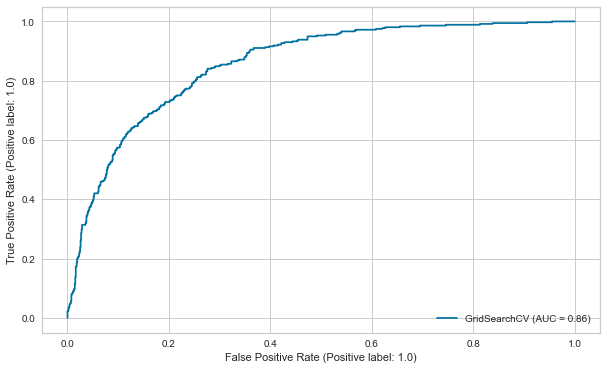

In [284]:
plot_roc_curve(LR_grid, X_test, y_test, response_method='auto');

In [ ]:
compare = pd.DataFrame({"Model": ["Logistic Regression", "SVM", "KNN", "Decision Tree", "Random Forest", "AdaBoost", "GradientBoost", "XGBoost"],
                        "F1": [log_f1, svm_grid_f1, knn_f1, dt_grid_f1, rf_grid_f1, ab_grid_f1, gb_f1, xgb_grid_f1],
                        "Recall": [log_recall, svm_grid_recall, knn_recall, dt_grid_recall, rf_grid_recall, ab_grid_recall, gb_recall, xgb_grid_recall],
                        "Accuracy": [log_acc, svm_grid_acc, knn_acc, dt_grid_acc, rf_grid_acc, ab_grid_acc, gb_acc, xgb_grid_acc],
                        "ROC_AUC": [log_auc, svm_grid_auc, knn_auc, dt_grid_auc, rf_grid_auc, ab_grid_auc, gb_auc, xgb_grid_auc]})

def labels(ax):
    for p in ax.patches:
        width = p.get_width()                        # get bar length
        ax.text(width,                               # set the text at 1 unit right of the bar
                p.get_y() + p.get_height() / 2,      # get Y coordinate + X coordinate / 2
                '{:1.3f}'.format(width),             # set variable to display, 2 decimals
                ha = 'left',                         # horizontal alignment
                va = 'center')                       # vertical alignment
    
plt.figure(figsize=(14,14))
plt.subplot(411)
compare = compare.sort_values(by="F1", ascending=False)
ax=sns.barplot(x="F1", y="Model", data=compare, palette="Blues_d")
labels(ax)

plt.subplot(412)
compare = compare.sort_values(by="Recall", ascending=False)
ax=sns.barplot(x="Recall", y="Model", data=compare, palette="Blues_d")
labels(ax)

plt.subplot(413)
compare = compare.sort_values(by="Accuracy", ascending=False)
ax=sns.barplot(x="Accuracy", y="Model", data=compare, palette="Blues_d")
labels(ax)

plt.subplot(414)
compare = compare.sort_values(by="ROC_AUC", ascending=False)
ax=sns.barplot(x="ROC_AUC", y="Model", data=compare, palette="Blues_d")
labels(ax)

plt.show()

<a id="9"></a>
## <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">9 - CONCLUSION</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**Both models obtained by K-Means and HCA in our analysis revealed that in the list of the most powerful armies of the world, the first name is that of the United States which has the most modern and strong military power.**

**The United States is perceived to be the most powerful country again, and has the world’s largest economy and biggest military budget, spending over $750 billion on military hardware and personnel in 2020.**

**Russia overtakes China and India to be seen as the second-most powerful country. For 2020, China is ranked 3 out of 138 countries holding a PwrIndx rating of 0.069 while India comes 4th in the list holding a PwrIndx rating of 0.095. However, all these three (3) countries are in the same cluster and among the world’s top military spenders. Following the top four (4) are Japan, South Korea, France and the U.K. are countries that have given out large amounts of military spending. France and the U.K took at 7th and 8th places with PwrIndx ratings of 0.170 and 0.172, respectively. Japan is ranked 5th out of 138 countries holding a PwrIndx rating of 0.150. Most probably the country continues to look to the future and viable solutions to growing regional problems – namely the threat from North Korea. South Korea is ranked 6th out of 138 countries holding a PwrIndx rating of 0.151. Similarly, under the ever-present threat of its unpredictable northern neighbor, South Korea manages a large and powerful military force. Egypt, Brazil and Turkey suprisingly overtakes Italy and Germany which are included in No. 8, 9, 10, 11 and 12 respectively.**

**Countries perceived to be less powerful tended to be smaller nations with medium to small economies. Bhutan, a small country in South Asia, is viewed as the least powerful nation, followed by Liberia, another small country in Afrika. Sierra Leone, Suriname and Somalia round out the bottom five.**

<a id="10"></a>
## <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">10 - REFERENCES</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

- Kline, R.B. (2011). Principles and practice of structural equation modeling (5th ed., pp. 3-427). New York:The Guilford Press.
- Edwards, A. (1976). An introduction to linear regression and correlation. W. H. Freeman
- Everitt, B. S.; Skrondal, A. (2010), The Cambridge Dictionary of Statistics, Cambridge University Press.
- https://www.amazon.com/Python-Feature-Engineering-Cookbook-transforming/dp/1789806313/ref=sr_1_1?dchild=1&keywords=feature+engineering+cookbook&qid=1627628487&s=books&sr=1-1
- https://www.amazon.com/Feature-Engineering-Made-Easy-Identify-ebook/dp/B077N6MK5W
- https://www.amazon.com/Feature-Engineering-Selection-Chapman-Science/dp/1032090855/ref=sr_1_1?crid=19T9G95E1W7VJ&dchild=1&keywords=feature+engineering+and+selection+kuhn&qid=1628050948&sprefix=feature+engineering+and+%2Cdigital-text%2C293&sr=8-1
- https://www.amazon.com/Introduction-Machine-Learning-Python-Scientists/dp/1449369413
- Neural Networks from Scratch in Python (by Kinsley § Kukiela) [external link text](https://nnfs.io/)
- Practical Statistics for Data Scientists (by Bruce & Gedeck) [external link text](https://www.amazon.com/Practical-Statistics-Data-Scientists-Essential/dp/149207294X/ref=sr_1_1?dchild=1&keywords=Practical+Statistics+for+Data+Scientists&qid=1627662007&sr=8-1)
- Applications of Deep Neural Networks(by Jeff Heaton) [external link text](https://arxiv.org/abs/2009.05673)
- Applied Predictive Modeling (by Kuhn & Johnson) [external link text](https://www.amazon.com/Applied-Predictive-Modeling-Max-Kuhn/dp/1461468485/ref=pd_sbs_3/141-4288971-3747365?pd_rd_w=AOIS7&pf_rd_p=3676f086-9496-4fd7-8490-77cf7f43f846&pf_rd_r=MCCHJXWK39VD6VW7RVAR&pd_rd_r=4ffcd1ea-44b9-4f33-b9b3-dc02ee159662&pd_rd_wg=nU1Ex&pd_rd_i=1461468485&psc=1:)
- Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow (by Aurélien Géron) [external link text](https://www.amazon.com/Hands-Machine-Learning-Scikit-Learn-TensorFlow/dp/1492032646/ref=sr_1_1?crid=2GV554Q2EKD1E&dchild=1&keywords=hands-on+machine+learning+with+scikit-learn%2C+keras%2C+and+tensorflow&qid=1627628294&s=books&sprefix=hands%2Cstripbooks-intl-ship%2C309&sr=1-1)
- Master Machine Learning Algorithms (by Brownlee, ML algorithms are very well explained ) [external link text](https://machinelearningmastery.com/master-machine-learning-algorithms/)
- Python Feature Engineering Cookbook (by Galli) [external link text](https://www.amazon.com/Python-Feature-Engineering-Cookbook-transforming/dp/1789806313/ref=sr_1_1?dchild=1&keywords=feature+engineering+cookbook&qid=1627628487&s=books&sr=1-1)
- Feature Engineering Made Easy (by Ozdemir & Susarla) [external link text](https://www.amazon.com/Feature-Engineering-Made-Easy-Identify-ebook/dp/B077N6MK5W)
- Feature Engineering and Selection (by Kuhn & Johnson) [external link text](https://www.amazon.com/Feature-Engineering-Selection-Chapman-Science/dp/1032090855/ref=sr_1_1?crid=19T9G95E1W7VJ&dchild=1&keywords=feature+engineering+and+selection+kuhn&qid=1628050948&sprefix=feature+engineering+and+%2Cdigital-text%2C293&sr=8-1)
- Imbalanced Classification with Python(by Brownlee) [external link text](https://machinelearningmastery.com/imbalanced-classification-with-python/)
- https://www.analyticsvidhya.com/blog/2021/06/generate-reports-using-pandas-profiling-deploy-using-streamlit/
- https://towardsdatascience.com/exploratory-data-analysis-with-pandas-profiling-de3aae2ddff3
- https://analyticsindiamag.com/why-data-scaling-is-important-in-machine-learning-how-to-effectively-do-it/
- https://www.analyticsvidhya.com/blog/2021/01/in-depth-intuition-of-k-means-clustering-algorithm-in-machine-learning/
- https://www.analyticsvidhya.com/blog/2021/01/in-depth-intuition-of-k-means-clustering-algorithm-in-machine-learning/
- https://www.kaggle.com/kadirduran/military-power-clustering
- https://www.analyticsvidhya.com/blog/2020/04/feature-scaling-machine-learning-normalization-standardization/
- https://machinelearningmastery.com/how-to-improve-neural-network-stability-and-modeling-performance-with-data-scaling/
- https://machinelearningmastery.com/how-to-stop-training-deep-neural-networks-at-the-right-time-using-early-stopping/#:~:text=Early%20stopping%20is%20a%20method,deep%20learning%20neural%20network%20models.

<a id="11"></a>
## <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">11 - FURTHER READINGS</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

- Kline, R.B. (2011). Principles and practice of structural equation modeling (5th ed., pp. 3-427). New York:The Guilford Press.
- Edwards, A. (1976). An introduction to linear regression and correlation. W. H. Freeman
- Everitt, B. S.; Skrondal, A. (2010), The Cambridge Dictionary of Statistics, Cambridge University Press.
- https://www.amazon.com/Python-Feature-Engineering-Cookbook-transforming/dp/1789806313/ref=sr_1_1?dchild=1&keywords=feature+engineering+cookbook&qid=1627628487&s=books&sr=1-1
- https://www.amazon.com/Feature-Engineering-Made-Easy-Identify-ebook/dp/B077N6MK5W
- https://www.amazon.com/Feature-Engineering-Selection-Chapman-Science/dp/1032090855/ref=sr_1_1?crid=19T9G95E1W7VJ&dchild=1&keywords=feature+engineering+and+selection+kuhn&qid=1628050948&sprefix=feature+engineering+and+%2Cdigital-text%2C293&sr=8-1
- https://www.amazon.com/Introduction-Machine-Learning-Python-Scientists/dp/1449369413
- Neural Networks from Scratch in Python (by Kinsley § Kukiela) [external link text](https://nnfs.io/)
- Practical Statistics for Data Scientists (by Bruce & Gedeck) [external link text](https://www.amazon.com/Practical-Statistics-Data-Scientists-Essential/dp/149207294X/ref=sr_1_1?dchild=1&keywords=Practical+Statistics+for+Data+Scientists&qid=1627662007&sr=8-1)
- Applications of Deep Neural Networks(by Jeff Heaton) [external link text](https://arxiv.org/abs/2009.05673)
- Applied Predictive Modeling (by Kuhn & Johnson) [external link text](https://www.amazon.com/Applied-Predictive-Modeling-Max-Kuhn/dp/1461468485/ref=pd_sbs_3/141-4288971-3747365?pd_rd_w=AOIS7&pf_rd_p=3676f086-9496-4fd7-8490-77cf7f43f846&pf_rd_r=MCCHJXWK39VD6VW7RVAR&pd_rd_r=4ffcd1ea-44b9-4f33-b9b3-dc02ee159662&pd_rd_wg=nU1Ex&pd_rd_i=1461468485&psc=1:)
- Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow (by Aurélien Géron) [external link text](https://www.amazon.com/Hands-Machine-Learning-Scikit-Learn-TensorFlow/dp/1492032646/ref=sr_1_1?crid=2GV554Q2EKD1E&dchild=1&keywords=hands-on+machine+learning+with+scikit-learn%2C+keras%2C+and+tensorflow&qid=1627628294&s=books&sprefix=hands%2Cstripbooks-intl-ship%2C309&sr=1-1)
- Master Machine Learning Algorithms (by Brownlee, ML algorithms are very well explained ) [external link text](https://machinelearningmastery.com/master-machine-learning-algorithms/)
- Python Feature Engineering Cookbook (by Galli) [external link text](https://www.amazon.com/Python-Feature-Engineering-Cookbook-transforming/dp/1789806313/ref=sr_1_1?dchild=1&keywords=feature+engineering+cookbook&qid=1627628487&s=books&sr=1-1)
- Feature Engineering Made Easy (by Ozdemir & Susarla) [external link text](https://www.amazon.com/Feature-Engineering-Made-Easy-Identify-ebook/dp/B077N6MK5W)
- Feature Engineering and Selection (by Kuhn & Johnson) [external link text](https://www.amazon.com/Feature-Engineering-Selection-Chapman-Science/dp/1032090855/ref=sr_1_1?crid=19T9G95E1W7VJ&dchild=1&keywords=feature+engineering+and+selection+kuhn&qid=1628050948&sprefix=feature+engineering+and+%2Cdigital-text%2C293&sr=8-1)
- Imbalanced Classification with Python(by Brownlee) [external link text](https://machinelearningmastery.com/imbalanced-classification-with-python/)
- https://www.kaggle.com/kaanboke/the-most-common-evaluation-metrics-a-gentle-intro

**Have fun while...** 👋

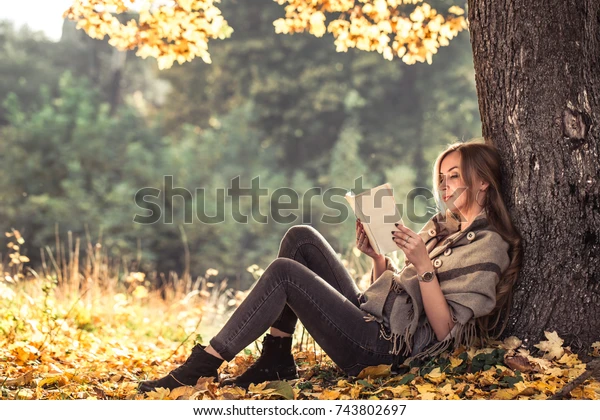

Image credit: https://www.shutterstock.com/tr/image-photo/beautiful-girl-reading-book-autumn-forest-743802697